In [1]:
!pip install --upgrade pip
!pip install --upgrade torch torchvision torchaudio
!pip install --upgrade transformers sentence-transformers
!pip install --upgrade bertopic umap-learn hdbscan
!pip install vaderSentiment textblob nltk tqdm
!pip install numpy==1.23.5 scipy==1.10.1 scikit-learn==1.2.2 pandas
!pip install spacy geopandas wordcloud matplotlib seaborn
!python -m spacy download en_core_web_trf
!python -m spacy download en_core_web_sm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 154.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autogluon-multimodal 1.1.1 requires nvidia-ml-py3==7.352.0, which is not installed.
amzn-sagemaker-studio-dataengineering-sessions 1.0 requires pytest, which is not installed.
autogluon-core 1.1.1 requires scikit-learn<1.4.1,>=1.3.0, but you have scikit-learn 1.2.2 which is incompatible.
autogluon-features 1.1.1 requires scikit-learn<1.4.1,>=1.3.0, but you have scikit-learn 1.2.2 which is incompatible.
autogluon-multimodal 1.1.1 requires accelerate<0.22.0,>=0.21.0, but you have accelerate 0.29.3 which is incompatible.
autogluon-multimodal 1.1.1 requires jsonschema<4.22,>=4.18, but you ha

In [2]:
!pip install --upgrade numpy
!pip uninstall -y numba umap-learn hdbscan bertopic
!pip install --no-cache-dir numba umap-learn hdbscan bertopic
!pip install s3fs
!pip uninstall torch torchvision torchaudio -y
!pip cache purge
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu

Found existing installation: numba 0.61.0
Uninstalling numba-0.61.0:
  Successfully uninstalled numba-0.61.0
Found existing installation: umap-learn 0.5.7
Uninstalling umap-learn-0.5.7:
  Successfully uninstalled umap-learn-0.5.7
Found existing installation: hdbscan 0.8.40
Uninstalling hdbscan-0.8.40:
  Successfully uninstalled hdbscan-0.8.40
Found existing installation: bertopic 0.16.4
Uninstalling bertopic-0.16.4:
  Successfully uninstalled bertopic-0.16.4
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 297.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 392.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 567.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.3
    Uninstalling numpy-2.2.3:
      Successfully uninstalled numpy-2.2.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following 

In [3]:
import torch
print(torch.__version__)


2.6.0+cpu


In [4]:
# General Libraries
import pandas as pd
import numpy as np
import re
import spacy
import s3fs
import itertools
from collections import Counter
from concurrent.futures import ProcessPoolExecutor

# Sentiment Analysis
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Topic Modeling (BERTopic)
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
import umap
import hdbscan

# Machine Learning & NLP
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse.linalg import svds
from sklearn.cluster import DBSCAN

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from wordcloud import WordCloud
import tqdm

# Transformers (For Fine-Tuned BERT Sentiment Analysis)
from transformers import pipeline


2025-03-04 04:54:36.693385: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
# Load dataset
business_file_path='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3pzf7egi4el3xj/dev/yelp_academic_dataset_business.json' #S3 location of business.json
review_file_path='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3pzf7egi4el3xj/dev/yelp_academic_dataset_review.json'  #S3 location of review.json
business_df = pd.read_json(business_file_path, lines=True)
review_df = pd.read_json(review_file_path, lines=True)



In [6]:
# Data Exploration
print("Business DataFrame Info:")
print(business_df.info())

Business DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150346 entries, 0 to 150345
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   business_id   150346 non-null  object 
 1   name          150346 non-null  object 
 2   address       150346 non-null  object 
 3   city          150346 non-null  object 
 4   state         150346 non-null  object 
 5   postal_code   150346 non-null  object 
 6   latitude      150346 non-null  float64
 7   longitude     150346 non-null  float64
 8   stars         150346 non-null  float64
 9   review_count  150346 non-null  int64  
 10  is_open       150346 non-null  int64  
 11  attributes    136602 non-null  object 
 12  categories    150243 non-null  object 
 13  hours         127123 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 16.1+ MB
None


In [7]:
print("\nFirst few rows of the Business DataFrame:")
print(business_df.head())


First few rows of the Business DataFrame:
              business_id                      name  \
0  Pns2l4eNsfO8kk83dixA6A  Abby Rappoport, LAC, CMQ   
1  mpf3x-BjTdTEA3yCZrAYPw             The UPS Store   
2  tUFrWirKiKi_TAnsVWINQQ                    Target   
3  MTSW4McQd7CbVtyjqoe9mw        St Honore Pastries   
4  mWMc6_wTdE0EUBKIGXDVfA  Perkiomen Valley Brewery   

                           address           city state postal_code  \
0           1616 Chapala St, Ste 2  Santa Barbara    CA       93101   
1  87 Grasso Plaza Shopping Center         Affton    MO       63123   
2             5255 E Broadway Blvd         Tucson    AZ       85711   
3                      935 Race St   Philadelphia    PA       19107   
4                    101 Walnut St     Green Lane    PA       18054   

    latitude   longitude  stars  review_count  is_open  \
0  34.426679 -119.711197    5.0             7        0   
1  38.551126  -90.335695    3.0            15        1   
2  32.223236 -110.880452 

In [8]:
# Missing values
business_df.isnull().sum()

business_id         0
name                0
address             0
city                0
state               0
postal_code         0
latitude            0
longitude           0
stars               0
review_count        0
is_open             0
attributes      13744
categories        103
hours           23223
dtype: int64

In [9]:
# Data Exploration
# Quick Inspection
print("Review DataFrame Info:")
print(review_df.info())

Review DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6990280 entries, 0 to 6990279
Data columns (total 9 columns):
 #   Column       Dtype         
---  ------       -----         
 0   review_id    object        
 1   user_id      object        
 2   business_id  object        
 3   stars        int64         
 4   useful       int64         
 5   funny        int64         
 6   cool         int64         
 7   text         object        
 8   date         datetime64[ns]
dtypes: datetime64[ns](1), int64(4), object(4)
memory usage: 480.0+ MB
None


In [10]:
print("\nFirst few rows of the Review DataFrame:")
print(review_df.head())


First few rows of the Review DataFrame:
                review_id                 user_id             business_id  \
0  KU_O5udG6zpxOg-VcAEodg  mh_-eMZ6K5RLWhZyISBhwA  XQfwVwDr-v0ZS3_CbbE5Xw   
1  BiTunyQ73aT9WBnpR9DZGw  OyoGAe7OKpv6SyGZT5g77Q  7ATYjTIgM3jUlt4UM3IypQ   
2  saUsX_uimxRlCVr67Z4Jig  8g_iMtfSiwikVnbP2etR0A  YjUWPpI6HXG530lwP-fb2A   
3  AqPFMleE6RsU23_auESxiA  _7bHUi9Uuf5__HHc_Q8guQ  kxX2SOes4o-D3ZQBkiMRfA   
4  Sx8TMOWLNuJBWer-0pcmoA  bcjbaE6dDog4jkNY91ncLQ  e4Vwtrqf-wpJfwesgvdgxQ   

   stars  useful  funny  cool  \
0      3       0      0     0   
1      5       1      0     1   
2      3       0      0     0   
3      5       1      0     1   
4      4       1      0     1   

                                                text                date  
0  If you decide to eat here, just be aware it is... 2018-07-07 22:09:11  
1  I've taken a lot of spin classes over the year... 2012-01-03 15:28:18  
2  Family diner. Had the buffet. Eclectic assortm... 2014-02-05 20:30:30

In [11]:
# Missing values
review_df.isnull().sum()

review_id      0
user_id        0
business_id    0
stars          0
useful         0
funny          0
cool           0
text           0
date           0
dtype: int64

In [12]:
# Filter restaurant & food businesses
restaurant_food_df = business_df[business_df['categories'].str.contains('Korean', case=False, na=False)]

# Merge with the reviews dataset on 'business_id'
restaurant_reviews = review_df.merge(restaurant_food_df[['business_id']], on='business_id', how='inner')

### 1. Number of Reviews
num_reviews = restaurant_reviews.shape[0]
print(f"Total number of reviews for restaurant and food businesses: {num_reviews}")

Total number of reviews for restaurant and food businesses: 56328


In [13]:
### 2. Tokenization and Text Analysis
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])

def preprocess_texts(texts):
    processed_texts = []

    # Use nlp.pipe() for batch processing
    for doc in nlp.pipe(texts, batch_size=1000, n_process=4):  # Adjust batch size and parallel processes as needed
        tokens = [token.text for token in doc if token.is_alpha and not token.is_stop]
        processed_texts.append(tokens)

    return processed_texts

# Apply batch processing
restaurant_reviews['tokens'] = preprocess_texts(restaurant_reviews['text'].tolist())

In [14]:
### 3. Total Number of Tokens
total_tokens = sum(restaurant_reviews['tokens'].apply(len))

In [15]:
### 4. Vocabulary Size (Unique Words)
all_words = [word for tokens in restaurant_reviews['tokens'] for word in tokens]
vocab_size = len(set(all_words))

In [16]:
### 5. Average Review Length
avg_review_length = total_tokens / num_reviews

In [17]:
### 6. Number of Unique Customers
num_unique_customers = restaurant_reviews['user_id'].nunique()

In [18]:
### 7. Number of Businesses Covered
num_businesses = restaurant_food_df['business_id'].nunique()

In [19]:
### 8. Number of Regions Covered
num_regions = restaurant_food_df['state'].nunique()

In [20]:
### 9. Average Stars per Review
avg_stars = restaurant_reviews['stars'].mean()

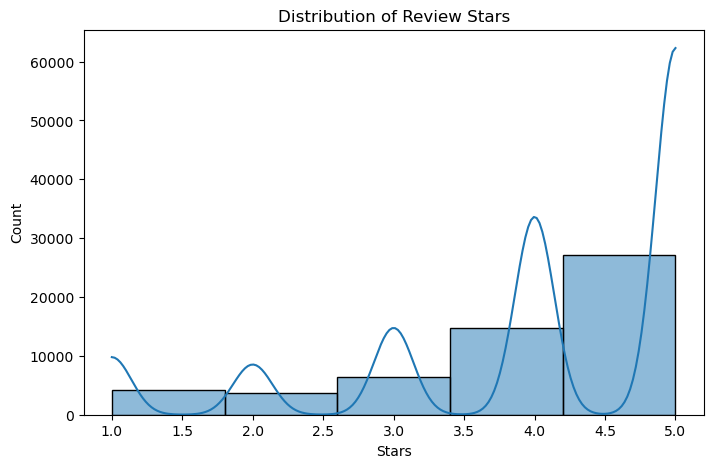

In [21]:
### 10. Distribution of Stars
plt.figure(figsize=(8, 5))
sns.histplot(restaurant_reviews['stars'], bins=5, kde=True)
plt.title('Distribution of Review Stars')
plt.xlabel('Stars')
plt.ylabel('Count')
plt.show()

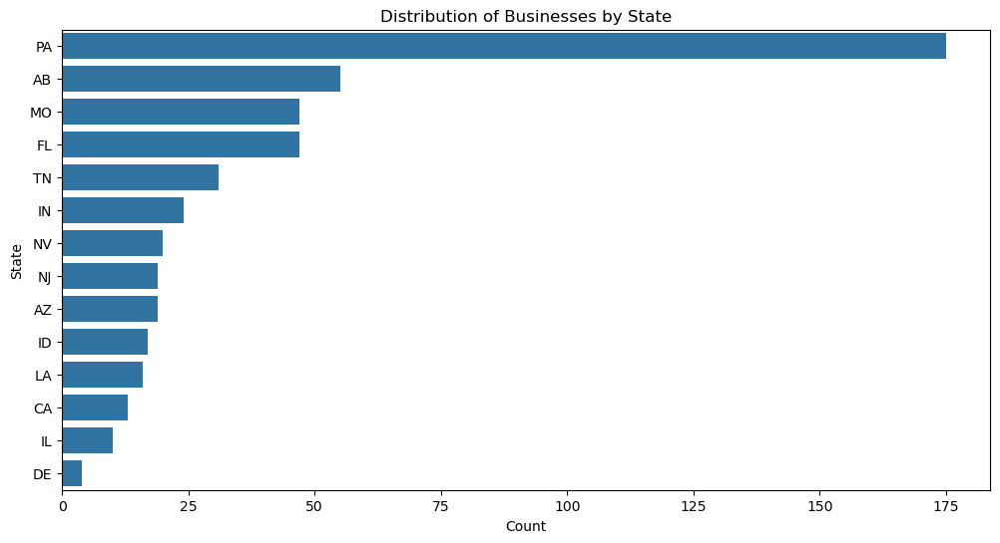

In [22]:
### 11. Distribution of Businesses Across States
plt.figure(figsize=(12, 6))
sns.countplot(y=restaurant_food_df['state'], order=restaurant_food_df['state'].value_counts().index)
plt.title('Distribution of Businesses by State')
plt.xlabel('Count')
plt.ylabel('State')
plt.show()

In [23]:
### 12. Average Votes per Review (Useful, Funny, Cool)
avg_votes = restaurant_reviews[['useful', 'funny', 'cool']].mean()

In [24]:
# Print Summary Statistics
print(f"Total Number of Reviews: {num_reviews}")
print(f"Total Number of Tokens: {total_tokens}")
print(f"Vocabulary Size: {vocab_size}")
print(f"Average Review Length: {avg_review_length:.2f} words")
print(f"Number of Unique Customers: {num_unique_customers}")
print(f"Number of Businesses Covered: {num_businesses}")
print(f"Number of Regions Covered: {num_regions}")
print(f"Average Stars per Review: {avg_stars:.2f}")
print(f"Average Votes per Review: {avg_votes.to_dict()}")

Total Number of Reviews: 56328
Total Number of Tokens: 2568020
Vocabulary Size: 49519
Average Review Length: 45.59 words
Number of Unique Customers: 41439
Number of Businesses Covered: 497
Number of Regions Covered: 14
Average Stars per Review: 4.01
Average Votes per Review: {'useful': 1.1966162476920892, 'funny': 0.3449794063343275, 'cool': 0.61488069876438}


###  Preliminary Data Exploration

In [25]:
# Tokenizing and cleaning text data
def preprocess_texts(texts):
    processed_texts = []
    for doc in nlp.pipe(texts, batch_size=500, n_process=4):
        tokens = [token.lemma_.lower() for token in doc if token.is_alpha and not token.is_stop]
        processed_texts.append(tokens)
    return processed_texts


In [26]:
# Getting most common words
all_words = [word for tokens in restaurant_reviews['tokens'] for word in tokens]
word_freq = Counter(all_words)
common_words = word_freq.most_common(5000)
print("Most Common Words:", common_words)

Most Common Words: [('food', 46859), ('place', 32807), ('good', 32782), ('Korean', 30336), ('like', 20125), ('great', 19323), ('time', 17323), ('chicken', 17079), ('service', 16771), ('restaurant', 15175), ('spicy', 14213), ('rice', 12901), ('sushi', 12782), ('order', 12567), ('ordered', 12310), ('delicious', 12065), ('try', 11941), ('got', 11578), ('menu', 10729), ('sauce', 10310), ('eat', 9775), ('dishes', 9751), ('little', 9547), ('came', 9281), ('fried', 9241), ('nice', 9135), ('definitely', 9080), ('come', 8945), ('meat', 8908), ('best', 8869), ('love', 8455), ('hot', 8341), ('pork', 7941), ('fresh', 7864), ('beef', 7783), ('pretty', 7777), ('lunch', 7626), ('friendly', 7550), ('soup', 7416), ('table', 6842), ('staff', 6727), ('bowl', 6700), ('experience', 6629), ('meal', 6590), ('recommend', 6447), ('better', 6421), ('wings', 6376), ('amazing', 6346), ('BBQ', 6240), ('flavor', 6160), ('favorite', 6160), ('kimchi', 6137), ('people', 6135), ('small', 6038), ('bit', 5993), ('dish', 

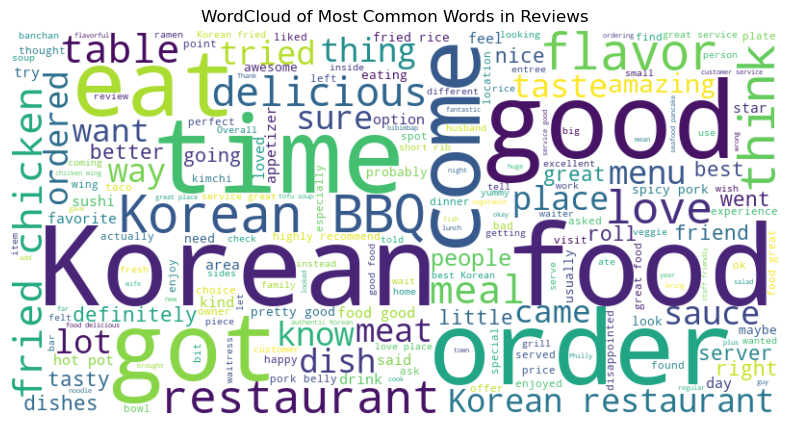

In [27]:
# WordCloud Visualization
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud of Most Common Words in Reviews")
plt.show()

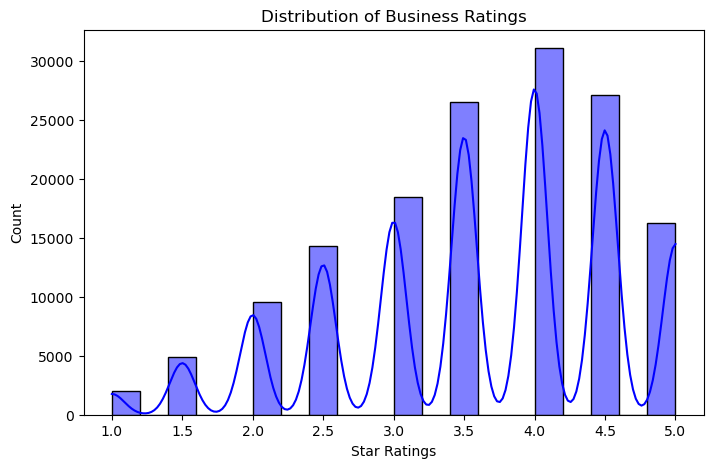

In [28]:
# Distribution of Ratings
plt.figure(figsize=(8, 5))
sns.histplot(business_df['stars'], bins=20, kde=True, color='blue')
plt.title("Distribution of Business Ratings")
plt.xlabel("Star Ratings")
plt.ylabel("Count")
plt.show()

In [29]:
# Filter for Korean restaurants in selected states
selected_states = ['CA', 'NY', 'TX', 'FL', 'AZ', 'HI']
korean_restaurants = business_df[
    (business_df['categories'].str.contains('Korean', na=False, case=False)) &  # Filter by category
    (business_df['state'].isin(selected_states))  # Filter by state
]


In [30]:
# Merge Korean restaurant data with reviews
yelp_data = review_df.merge(
    korean_restaurants[['business_id', 'name', 'state', 'latitude', 'longitude', 'stars', 'review_count']], 
    on='business_id', 
    how='inner'
)


In [31]:
print(yelp_data.columns)

Index(['review_id', 'user_id', 'business_id', 'stars_x', 'useful', 'funny',
       'cool', 'text', 'date', 'name', 'state', 'latitude', 'longitude',
       'stars_y', 'review_count'],
      dtype='object')


In [32]:
#  Ensure correct column names (stars_y is for businesses)
def get_unique_top_bottom(df, state):
    state_data = df[df['state'] == state].drop_duplicates(subset=['business_id'])
    top_5 = state_data[state_data['stars_y'] > 3].nlargest(5, 'stars_y')  # Above 3 stars
    bottom_5 = state_data[state_data['stars_y'] <= 3].nsmallest(5, 'stars_y')  # 3 stars or below
    return top_5, bottom_5


In [33]:
print(korean_restaurants.columns)

Index(['business_id', 'name', 'address', 'city', 'state', 'postal_code',
       'latitude', 'longitude', 'stars', 'review_count', 'is_open',
       'attributes', 'categories', 'hours'],
      dtype='object')


In [34]:
# Filter Korean restaurants in selected states
selected_states = ['CA', 'NY', 'TX', 'FL', 'AZ', 'HI']
korean_restaurants = business_df[
    (business_df['categories'].str.contains('Korean', na=False, case=False)) &
    (business_df['state'].isin(selected_states))
]

In [35]:
# Merge with reviews to get restaurant-specific ratings
yelp_data = review_df.merge(
    korean_restaurants[['business_id', 'name', 'state', 'latitude', 'longitude', 'stars', 'review_count']], 
    on='business_id', 
    how='inner'
)

In [36]:
# Compute aggregated average ratings per restaurant
restaurant_ratings = (
    yelp_data.groupby(['business_id', 'name', 'state'])
    .agg(avg_stars=('stars_y', 'mean'), total_reviews=('review_count', 'sum'))
    .reset_index()
)

In [37]:
# Filter restaurants with more than 10 reviews to ensure reliability
filtered_restaurants = restaurant_ratings[restaurant_ratings['total_reviews'] > 10]


In [38]:
# Function to get top 5 & bottom 5 unique restaurants per state
def get_unique_top_bottom(df, state):
    state_data = df[df['state'] == state]
    top_5 = state_data.nlargest(5, 'avg_stars')
    bottom_5 = state_data.nsmallest(5, 'avg_stars')
    return top_5, bottom_5

In [66]:
# Identify top and bottom 5 unique restaurants for each state
top_5_list, bottom_5_list = [], []
for state in selected_states:
    t5, b5 = get_unique_top_bottom(filtered_restaurants, state)
    top_5_list.append(t5)
    bottom_5_list.append(b5)

top_5_df = pd.concat(top_5_list).reset_index(drop=True)
bottom_5_df = pd.concat(bottom_5_list).reset_index(drop=True)

print("Unique Top 15 & Bottom 15 Korean Restaurants Identified Across All States!")

# Display the results
print("Top 15 Restaurants by State:")
print(top_5_df[['name', 'state', 'avg_stars', 'total_reviews']])

print("\nBottom 15 Restaurants by State:")
print(bottom_5_df[['name', 'state', 'avg_stars', 'total_reviews']])

Unique Top 15 & Bottom 15 Korean Restaurants Identified Across All States!
Top 15 Restaurants by State:
                              name state  avg_stars  total_reviews
0           Choi's Oriental Market    CA        4.5          31150
1                       Secret Bao    CA        4.5          21895
2                 East Beach Tacos    CA        4.5         742152
3                      Kogilicious    CA        4.0          16512
4                Kimchi Korean BBQ    CA        4.0         100776
5   Gangnam Style Restaurant Tampa    FL        5.0            361
6                     Fuzion Spice    FL        5.0           6400
7                    Ginger's Cafe    FL        5.0             36
8                         Dooriban    FL        4.5          47300
9                    Soul Of Korea    FL        4.5          57596
10                    Wings & Rice    AZ        4.0          55687
11                           Bushi    AZ        4.0          14036
12                 KOGI K

# There are no Korean tagged cuisine wise Restaurants in NY, TX and HI, which also makes up the potential market for emerging restaurants

In [40]:
print("\nTop 5 Korean Restaurants Being Analyzed:")
print(top_5_df[['name', 'state']])

print("\nBottom 5 Korean Restaurants Being Analyzed:")
print(bottom_5_df[['name', 'state']])



Top 5 Korean Restaurants Being Analyzed:
                              name state
0           Choi's Oriental Market    CA
1                       Secret Bao    CA
2                 East Beach Tacos    CA
3                      Kogilicious    CA
4                Kimchi Korean BBQ    CA
5   Gangnam Style Restaurant Tampa    FL
6                     Fuzion Spice    FL
7                    Ginger's Cafe    FL
8                         Dooriban    FL
9                    Soul Of Korea    FL
10                    Wings & Rice    AZ
11                           Bushi    AZ
12                 KOGI Korean BBQ    AZ
13                    Kampai Sushi    AZ
14                     Kimchi Time    AZ

Bottom 5 Korean Restaurants Being Analyzed:
                                   name state
0                           Little Asia    CA
1                     iGrill Korean BBQ    CA
2                            Cafe Int'l    CA
3                     iGrill Korean BBQ    CA
4                       Sus

In [41]:
# Top & Bottom 5 Restaurants by Rating
top_5_restaurants = korean_restaurants.groupby('name').agg({'stars': 'mean'}).nlargest(5, 'stars').index.tolist()
bottom_5_restaurants = korean_restaurants.groupby('name').agg({'stars': 'mean'}).nsmallest(5, 'stars').index.tolist()


In [42]:
# Filter relevant reviews
filtered_reviews = korean_restaurants[korean_restaurants['name'].isin(top_5_restaurants + bottom_5_restaurants)]
print("Filtered Reviews:")
print(filtered_reviews.head())

Filtered Reviews:
                  business_id                            name  \
6291   ow_vaAcbxjw-TOdGilc4AQ                       Sushi Zen   
40034  748Tn5Hsf4LMCCA_WxVBfA                     Little Asia   
56096  2jRrqwGjgHgJ9rn0Ptaxuw                    Fuzion Spice   
59642  l3LUxNBkQPG1gAwI7P11ew             Bento Asian Kitchen   
73057  -nb8_qHFjnYgQAYbkZ_yDw  Gangnam Style Restaurant Tampa   

                       address              city state postal_code   latitude  \
6291            11024 4th St N  Saint Petersburg    FL       33716  27.871642   
40034           6527 Madrid Rd        Isla Vista    CA       93117  34.412332   
56096   13709 N Dale Mabry Hwy             Tampa    FL       33618  28.070543   
59642  1910 N Ola Ave, Unit 11             Tampa    FL       33602  27.961106   
73057       701 E Fletcher Ave             Tampa    FL       33612  28.068820   

        longitude  stars  review_count  is_open  \
6291   -82.638940    2.5            17        0   
40

In [43]:
print(filtered_reviews.columns)


Index(['business_id', 'name', 'address', 'city', 'state', 'postal_code',
       'latitude', 'longitude', 'stars', 'review_count', 'is_open',
       'attributes', 'categories', 'hours'],
      dtype='object')


In [44]:
# Ensure 'text' column is included in the merged dataset
restaurant_reviews = review_df[['business_id', 'text']].merge(
    business_df[['business_id', 'name', 'stars', 'categories', 'state']], 
    on='business_id', 
    how='inner'
)

In [45]:
korean_restaurants = restaurant_reviews[restaurant_reviews['categories'].str.contains('Korean', case=False, na=False)]
filtered_reviews = korean_restaurants[korean_restaurants['name'].isin(top_5_restaurants + bottom_5_restaurants)]


In [46]:
print(filtered_reviews.columns)

Index(['business_id', 'text', 'name', 'stars', 'categories', 'state'], dtype='object')


In [47]:
import nltk
nltk.download('vader_lexicon')
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

# Download VADER lexicon if not available
nltk.download('vader_lexicon')

# Sentiment Analysis using VADER
sia = SentimentIntensityAnalyzer()
filtered_reviews['sentiment_score'] = filtered_reviews['text'].apply(lambda x: sia.polarity_scores(str(x))['compound'])
filtered_reviews['sentiment'] = filtered_reviews['sentiment_score'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
print("Sentiment Analysis (VADER) Sample:")
print(filtered_reviews[['text', 'sentiment', 'sentiment_score']].head())

[nltk_data] Downloading package vader_lexicon to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Sentiment Analysis (VADER) Sample:
                                                    text sentiment  \
17270  We were in St Pete on the weekend and decide t...  Negative   
49549  Craving Korean food and where to go in St Pete...  Positive   
53140  I had a craving for sushi during a business tr...  Positive   
67936  Sushi Zen has been in this location for more t...  Positive   
99475  The dolsot bibimbap was delicious! My boyfrien...  Positive   

       sentiment_score  
17270          -0.8172  
49549           0.9922  
53140           0.2989  
67936           0.9630  
99475           0.9300  


In [48]:
#  Filter Review Data for Top 5 & Bottom 5 Korean Restaurants
top_reviews = review_df[review_df['business_id'].isin(top_5_df['business_id'])]
bottom_reviews = review_df[review_df['business_id'].isin(bottom_5_df['business_id'])]

print(f" Total Reviews for Top 5 Restaurants: {len(top_reviews)}")
print(f" Total Reviews for Bottom 5 Restaurants: {len(bottom_reviews)}")


 Total Reviews for Top 5 Restaurants: 3155
 Total Reviews for Bottom 5 Restaurants: 1740


## Sentiment Distribution for Each Restaurant (Top 5 & Bottom 5)

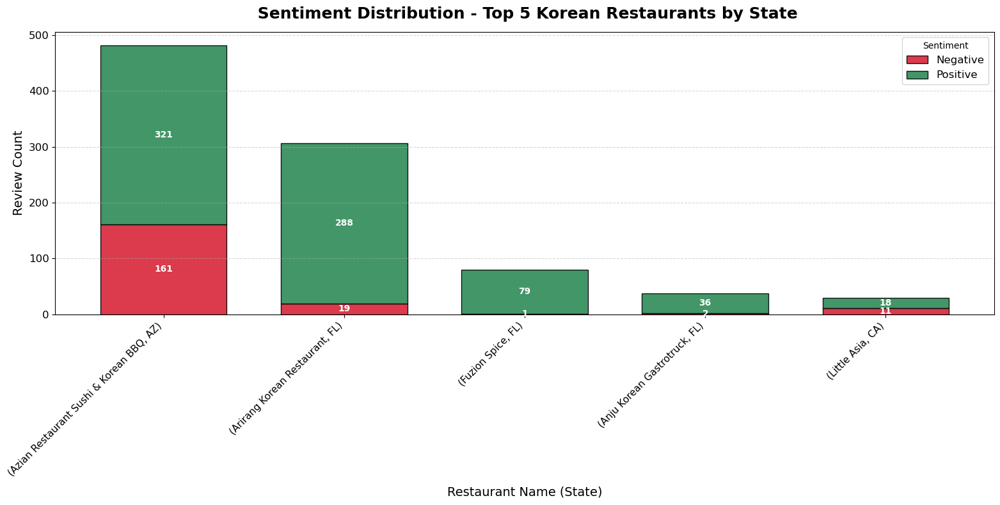

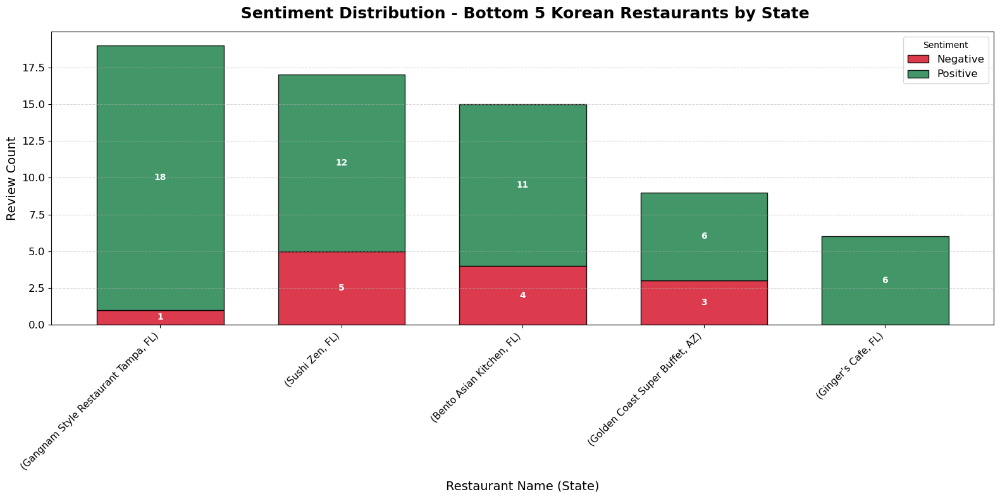

In [49]:
# Count sentiment for each restaurant and state
sentiment_counts = filtered_reviews.groupby(['name', 'state', 'sentiment']).size().unstack(fill_value=0)

# Sort by total reviews
sentiment_counts['total_reviews'] = sentiment_counts.sum(axis=1)
sentiment_counts = sentiment_counts.sort_values(by='total_reviews', ascending=False).drop(columns=['total_reviews'])

#  Plot sentiment distribution for each restaurant by state
def plot_sentiment_distribution_by_state(sentiment_data, title, colors):
    fig, ax = plt.subplots(figsize=(16, 8))

    sentiment_data.plot(
        kind='bar', stacked=True, color=colors, edgecolor='black', alpha=0.9, width=0.7, ax=ax
    )

    # Add percentage labels inside bars
    for container in ax.containers:
        for bar in container:
            height = bar.get_height()
            if height > 0:
                ax.text(
                    bar.get_x() + bar.get_width() / 2,
                    bar.get_y() + height / 2,
                    f"{int(height)}",
                    ha='center', va='center', fontsize=10, fontweight='bold', color='white'
                )

    # Title & Labels
    plt.title(title, fontsize=18, fontweight='bold', pad=15)
    plt.xlabel("Restaurant Name (State)", fontsize=14, labelpad=10)
    plt.ylabel("Review Count", fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=11)
    plt.yticks(fontsize=12)
    plt.legend(title="Sentiment", labels=["Negative", "Positive"], loc='upper right', fontsize=12)

    # Grid and layout adjustments
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

#  Filter the sentiment counts by top 5 and bottom 5 restaurants and plot per state
top_reviews = sentiment_counts.head(5)
bottom_reviews = sentiment_counts.tail(5)

plot_sentiment_distribution_by_state(top_reviews, " Sentiment Distribution - Top 5 Korean Restaurants by State", ['#D72638', '#2E8B57'])
plot_sentiment_distribution_by_state(bottom_reviews, " Sentiment Distribution - Bottom 5 Korean Restaurants by State", ['#D72638', '#2E8B57'])


## Overall Sentiment Breakdown by State

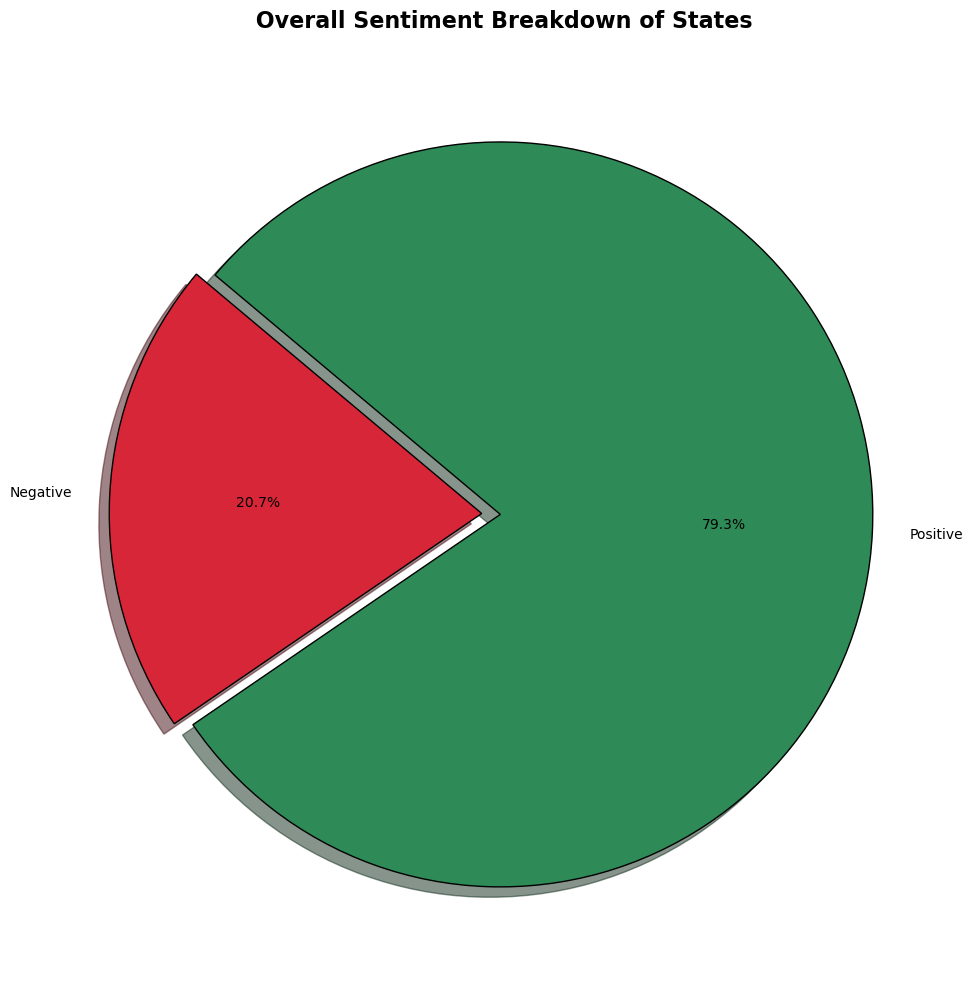

In [50]:
# Count sentiments for each state
sentiment_counts_by_state = filtered_reviews.groupby(['state', 'sentiment']).size().unstack(fill_value=0)

# Now create the sentiment pie chart for each state
# Plotting the sentiment distribution for all states (combining top and bottom reviews)
sentiment_pie = sentiment_counts_by_state.sum(axis=0)  # Summing all states for sentiment distribution

# Plot the pie chart
plt.figure(figsize=(10, 10))  # Bigger Pie Chart
sentiment_pie.plot(kind='pie', autopct='%1.1f%%', colors=['#D72638', '#2E8B57'], startangle=140, explode=(0.05, 0), shadow=True, wedgeprops={'edgecolor': 'black'})

plt.title(" Overall Sentiment Breakdown of States", fontsize=16, fontweight='bold', pad=15)
plt.tight_layout()
plt.show()


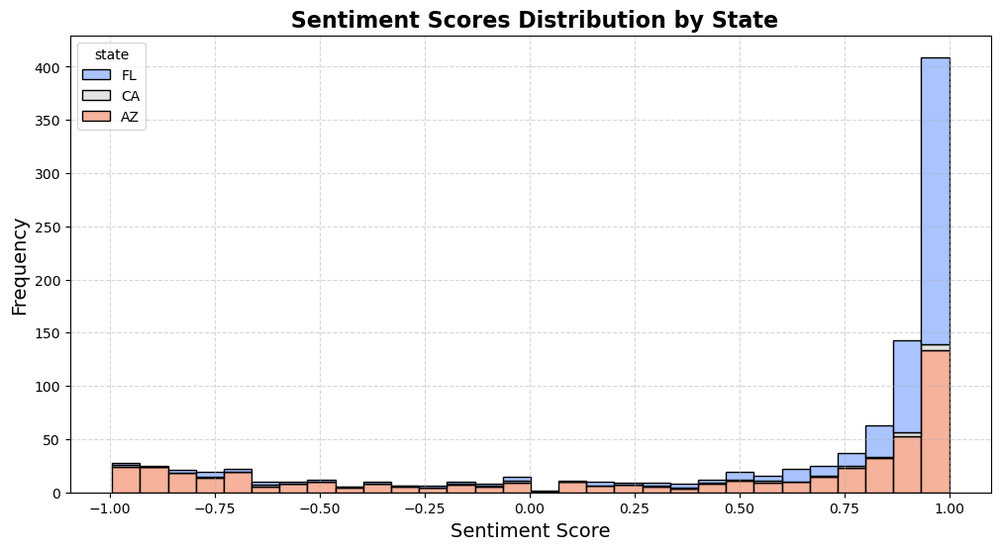

In [51]:
# Plot histogram of sentiment scores by state
plt.figure(figsize=(12, 6))
sns.histplot(filtered_reviews, x='sentiment_score', hue='state', multiple='stack', palette='coolwarm', bins=30)
plt.title(" Sentiment Scores Distribution by State", fontsize=16, fontweight='bold')
plt.xlabel("Sentiment Score", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


In [52]:
#  Filter Review Data for Top 5 & Bottom 5 Korean Restaurants
top_reviews = review_df[review_df['business_id'].isin(top_5_df['business_id'])]
bottom_reviews = review_df[review_df['business_id'].isin(bottom_5_df['business_id'])]

print(f" Total Reviews for Top 5 Restaurants: {len(top_reviews)}")
print(f" Total Reviews for Bottom 5 Restaurants: {len(bottom_reviews)}")

 Total Reviews for Top 5 Restaurants: 3155
 Total Reviews for Bottom 5 Restaurants: 1740


In [55]:
import re

# Define text preprocessing function
def preprocess_text(text):
    """Cleans the text by removing special characters, extra spaces, and converting to lowercase."""
    if isinstance(text, str):  # Ensure text is not NaN or None
        text = text.lower()  # Convert to lowercase
        text = re.sub(r"[^a-zA-Z0-9\s]", "", text)  # Remove special characters
        text = re.sub(r"\s+", " ", text).strip()  # Remove extra spaces
        return text
    return ""  # Return empty string if input is not valid

# Debugging: Check column names
print("Columns in top_reviews:", top_reviews.columns)
print("Columns in bottom_reviews:", bottom_reviews.columns)

# Apply preprocessing to the reviews
top_reviews['cleaned_review'] = top_reviews['text'].apply(preprocess_text)
bottom_reviews['cleaned_review'] = bottom_reviews['text'].apply(preprocess_text)


Columns in top_reviews: Index(['review_id', 'user_id', 'business_id', 'stars', 'useful', 'funny',
       'cool', 'text', 'date'],
      dtype='object')
Columns in bottom_reviews: Index(['review_id', 'user_id', 'business_id', 'stars', 'useful', 'funny',
       'cool', 'text', 'date'],
      dtype='object')


In [56]:
import torch
import hdbscan
from bertopic import BERTopic
from umap import UMAP
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import matplotlib.pyplot as plt

# Download necessary NLTK components
nltk.download('stopwords')
nltk.download('wordnet')
stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

# Preprocess the text (lemmatization + stopword removal)
def preprocess_text(text):
    text = text.lower()
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text

# Apply preprocessing
top_reviews['cleaned_review'] = top_reviews['text'].apply(preprocess_text)
bottom_reviews['cleaned_review'] = bottom_reviews['text'].apply(preprocess_text)

# Convert to lists
top_reviews_text = top_reviews['cleaned_review'].tolist()
bottom_reviews_text = bottom_reviews['cleaned_review'].tolist()

# Set device for embeddings
device = 'cuda' if torch.cuda.is_available() else 'cpu'

#  UMAP for dimensionality reduction (Increase `n_neighbors` for better topic separation)
umap_model = UMAP(n_components=5, n_neighbors=30, metric='cosine', random_state=42)

#  HDBSCAN for better topic clustering
hdbscan_model = hdbscan.HDBSCAN(
    min_cluster_size=20,  # Adjust to merge/split topics
    min_samples=1,  
    metric='euclidean',  
    cluster_selection_method='eom',
    prediction_data=True
)

# SentenceTransformer embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2", device=device)

#  CountVectorizer for token processing
vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words="english")

#  BERTopic with HDBSCAN, UMAP, and SentenceTransformer
topic_model = BERTopic(
    umap_model=umap_model,
    embedding_model=embedding_model,
    vectorizer_model=vectorizer_model,
    hdbscan_model=hdbscan_model,
    min_topic_size=12,
    verbose=True
)

# Fit BERTopic on top 5 restaurant reviews
top_topics, _ = topic_model.fit_transform(top_reviews_text)

# Fit BERTopic on bottom 5 restaurant reviews
bottom_topics, _ = topic_model.fit_transform(bottom_reviews_text)

#  Print top topics
print("Top 5 Restaurant Topics:")
print(topic_model.get_topics())

print("Bottom 5 Restaurant Topics:")
print(topic_model.get_topics())




[nltk_data] Downloading package stopwords to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
2025-03-04 05:04:21,294 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/99 [00:00<?, ?it/s]

2025-03-04 05:04:33,796 - BERTopic - Embedding - Completed ✓
2025-03-04 05:04:33,797 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-04 05:05:00,604 - BERTopic - Dimensionality - Completed ✓
2025-03-04 05:05:00,605 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-04 05:05:00,711 - BERTopic - Cluster - Completed ✓
2025-03-04 05:05:00,715 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-04 05:05:01,341 - BERTopic - Representation - Completed ✓
2025-03-04 05:05:01,626 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/55 [00:00<?, ?it/s]

2025-03-04 05:05:09,852 - BERTopic - Embedding - Completed ✓
2025-03-04 05:05:09,852 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-04 05:05:17,418 - BERTopic - Dimensionality - Completed ✓
2025-03-04 05:05:17,419 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-04 05:05:17,480 - BERTopic - Cluster - Completed ✓
2025-03-04 05:05:17,484 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-04 05:05:17,947 - BERTopic - Representation - Completed ✓


Top 5 Restaurant Topics:
{-1: [('sushi', 0.02162146732846337), ('food', 0.016942683711885013), ('good', 0.01615261351475947), ('place', 0.014693863876143385), ('roll', 0.013680889611003383), ('like', 0.012948913063779032), ('service', 0.011297218422932406), ('time', 0.011267252524729524), ('ordered', 0.010569792774922865), ('eat', 0.010554005165174761)], 0: [('korean', 0.04256840548176183), ('bbq', 0.025784354740775412), ('food', 0.021121836855698), ('korean bbq', 0.020786019384723596), ('place', 0.015579777315417456), ('restaurant', 0.014764174029532805), ('good', 0.014634053350432587), ('meat', 0.014364388844748105), ('korean food', 0.013339939301846855), ('grill', 0.011542810151399033)], 1: [('food', 0.01997104737669537), ('order', 0.019220033194988332), ('service', 0.016729556962528855), ('table', 0.01647399974098459), ('minute', 0.016430832811977807), ('asked', 0.016277318630482), ('manager', 0.015996362080590198), ('time', 0.015369436010960896), ('came', 0.015032263278519647), ('

In [ ]:
import matplotlib.pyplot as plt

# Bar Chart for Topic Word Scores 
fig_barchart = topic_model.visualize_barchart(top_n_topics=10)
fig_barchart.show()

# Intertopic Distance Map (bubble chart)
fig_intertopic = topic_model.visualize_topics()
fig_intertopic.show()


## Hierarchical Clustering of Topics

In [58]:
from bertopic import BERTopic

# Combine top and bottom reviews
all_reviews = top_reviews['cleaned_review'].tolist() + bottom_reviews['cleaned_review'].tolist()

# Fit BERTopic
topic_model = BERTopic(verbose=True)
topics, probs = topic_model.fit_transform(all_reviews)


2025-03-04 05:05:50,061 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/153 [00:00<?, ?it/s]

2025-03-04 05:06:11,135 - BERTopic - Embedding - Completed ✓
2025-03-04 05:06:11,136 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-04 05:06:27,778 - BERTopic - Dimensionality - Completed ✓
2025-03-04 05:06:27,779 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-04 05:06:27,946 - BERTopic - Cluster - Completed ✓
2025-03-04 05:06:27,950 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-03-04 05:06:28,249 - BERTopic - Representation - Completed ✓


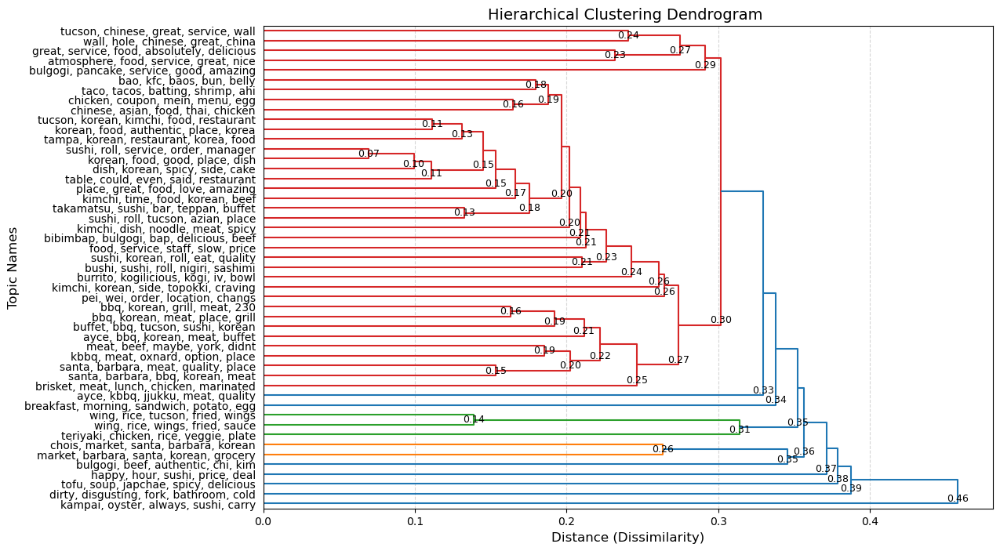

In [59]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram

# Extract topic embeddings
topic_representations = topic_model.topic_representations_
topic_names = {topic: ", ".join([word[0] for word in words[:5]]) for topic, words in topic_representations.items()}

# Get topic embeddings from BERTopic
topic_embeddings = topic_model.c_tf_idf_.toarray()

# Perform Hierarchical Clustering
linked = linkage(topic_embeddings, method='ward')

# Plot the Dendrogram (Horizontal)
fig, ax = plt.subplots(figsize=(12, 8))
dendro = dendrogram(linked, labels=[topic_names[t] for t in topic_model.get_topics().keys()], 
                    leaf_rotation=0, leaf_font_size=10, orientation="right", ax=ax)

# Add Annotations for Distance
for i, d in zip(dendro["icoord"], dendro["dcoord"]):
    x = (d[1] + d[2]) / 2  # Midpoint of the cluster merge
    y = i[1]  # Y-position (Cluster point)
    plt.text(x, y, f"{x:.2f}", va="bottom", ha="center", fontsize=9, color="black")

# Improve Readability
plt.title("Hierarchical Clustering Dendrogram ", fontsize=14)
plt.xlabel("Distance (Dissimilarity)", fontsize=12)
plt.ylabel("Topic Names", fontsize=12)
plt.grid(axis='x', linestyle="--", alpha=0.5)

plt.show()


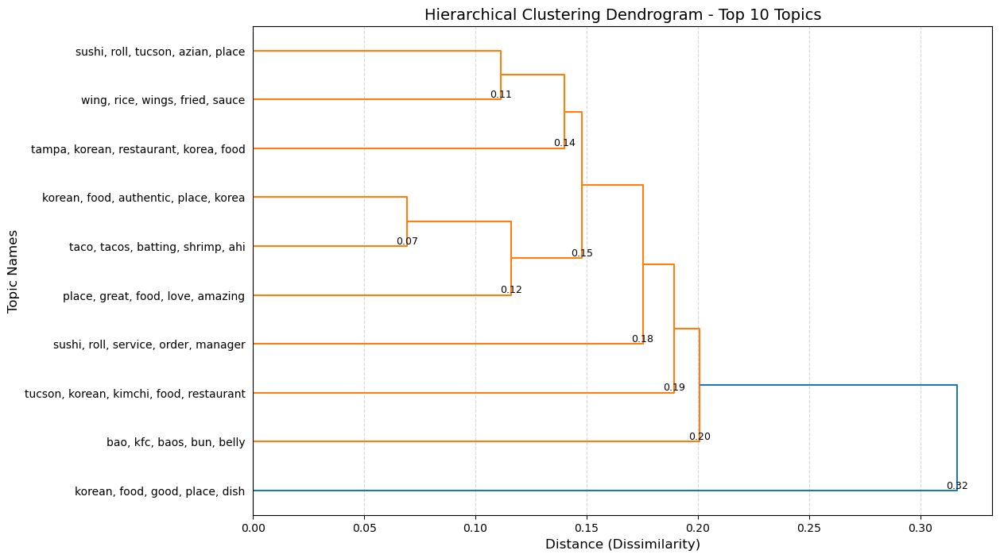

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram

# Extract topic embeddings
topic_representations = topic_model.topic_representations_
topic_names = {topic: ", ".join([word[0] for word in words[:5]]) for topic, words in topic_representations.items()}

# Get topic frequencies (to determine the most relevant topics)
topic_freq = topic_model.get_topic_freq().set_index("Topic")["Count"]

# Select the top 10 most relevant topics
top_10_topics = topic_freq.nlargest(10).index.tolist()

# Filter topic names and embeddings for only top 10 topics
filtered_topic_names = {t: topic_names[t] for t in top_10_topics if t in topic_names}
filtered_topic_embeddings = topic_model.c_tf_idf_[top_10_topics].toarray()

# Perform Hierarchical Clustering only on the top 10 topics
linked = linkage(filtered_topic_embeddings, method='ward')

# Plot the Dendrogram (Horizontal)
fig, ax = plt.subplots(figsize=(12, 8))
dendro = dendrogram(linked, labels=[filtered_topic_names[t] for t in top_10_topics], 
                    leaf_rotation=0, leaf_font_size=10, orientation="right", ax=ax)

# Add Annotations for Distance
for i, d in zip(dendro["icoord"], dendro["dcoord"]):
    x = (d[1] + d[2]) / 2  # Midpoint of the cluster merge
    y = i[1]  # Y-position (Cluster point)
    plt.text(x, y, f"{x:.2f}", va="bottom", ha="center", fontsize=9, color="black")

# Improve Readability
plt.title("Hierarchical Clustering Dendrogram - Top 10 Topics", fontsize=14)
plt.xlabel("Distance (Dissimilarity)", fontsize=12)
plt.ylabel("Topic Names", fontsize=12)
plt.grid(axis='x', linestyle="--", alpha=0.5)

plt.show()


In [61]:
import plotly.express as px

# Get the top 10 topics (same dictionary from before)
top_10_topics = {k: v for k, v in list(topic_model.get_topics().items())[:10]}

# Prepare the data for visualization
topics_data = []
for topic_num, words in top_10_topics.items():
    for word, weight in words:
        topics_data.append({'Topic': topic_num, 'Word': word, 'Weight': weight})

# Create a DataFrame for easy plotting
import pandas as pd
df_topics = pd.DataFrame(topics_data)

# Create an interactive bar plot
fig = px.bar(df_topics, x='Word', y='Weight', color='Topic', 
             title='Top 10 Topics: Word Weights', 
             labels={'Weight': 'Word Weight', 'Word': 'Words'},
             category_orders={'Topic': [str(i) for i in range(10)]})

fig.update_layout(showlegend=True, xaxis_tickangle=-45)
fig.show()


In [62]:
!pip install gensim


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [63]:
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary

def compute_coherence(topic_model, documents):
    # Get topic words
    topics = topic_model.get_topics()
    topic_words = [[word for word, _ in topic] for _, topic in topics.items() if topic]

    # Tokenize documents for coherence computation
    tokenized_docs = [doc.split() for doc in documents]

    # Create a dictionary and corpus
    dictionary = Dictionary(tokenized_docs)
    corpus = [dictionary.doc2bow(doc) for doc in tokenized_docs]

    # Compute coherence score using the c_v metric
    coherence_model = CoherenceModel(
        topics=topic_words,
        texts=tokenized_docs,
        dictionary=dictionary,
        coherence='c_v'
    )
    coherence_score = coherence_model.get_coherence()

    return coherence_score


In [64]:
coherence_1 = compute_coherence(topic_model, top_reviews_text + bottom_reviews_text)
print(f"Coherence Score for Approach 1: {coherence_1:.4f}")


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Coherence Score for Approach 1: 0.4606


In [65]:
import pandas as pd
from collections import Counter
import re

# List of popular Korean dishes (add more dishes if needed)
korean_dishes = [
    "kimchi", "bibimbap", "bulgogi", "japchae", "tteokbokki", 
    "galbi", "samgyeopsal", "soondubu jjigae", "naengmyeon", 
    "dak galbi", "kimbap", "mandu", "jjajangmyeon", "ramyeon", 
    "gimbap", "banchan", "banchans"
]

# Function to extract Korean dishes from text using keyword matching
def extract_dishes_from_text(text):
    dishes = [dish for dish in korean_dishes if dish.lower() in text.lower()]
    return dishes

# Extract dishes mentioned in reviews for top 5 and bottom 5 restaurants
top_5_dishes = Counter()
bottom_5_dishes = Counter()

# Loop through reviews of top 5 restaurants and extract dishes
for review in top_reviews['text']:
    dishes = extract_dishes_from_text(review)
    top_5_dishes.update(dishes)

# Loop through reviews of bottom 5 restaurants and extract dishes
for review in bottom_reviews['text']:
    dishes = extract_dishes_from_text(review)
    bottom_5_dishes.update(dishes)

# Display the most common dishes in both categories
print("Top 5 Restaurant Dishes:", top_5_dishes.most_common(10))
print("Bottom 5 Restaurant Dishes:", bottom_5_dishes.most_common(10))


Top 5 Restaurant Dishes: [('kimchi', 392), ('bulgogi', 294), ('bibimbap', 109), ('banchan', 93), ('galbi', 73), ('japchae', 68), ('mandu', 32), ('kimbap', 18), ('tteokbokki', 12), ('banchans', 7)]
Bottom 5 Restaurant Dishes: [('bulgogi', 113), ('kimchi', 87), ('banchan', 44), ('bibimbap', 38), ('galbi', 25), ('banchans', 4), ('mandu', 4), ('soondubu jjigae', 3), ('japchae', 2), ('samgyeopsal', 1)]
